In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import fftconvolve
from scipy.ndimage import maximum_filter, maximum_filter1d
from scipy.interpolate import interp2d
import IPython.display as ipd
from vocoder import *
from instruments import make_tune, fm_bell_note

# Part 1: Comb Filter Vocoder

In [2]:
y, sr = comb_tune("Tunes/birthday.txt", "birthday.wav", 0.125, 20)
ipd.Audio(y, rate=sr)

In [ ]:
y, sr = comb_tune("Tunes/daft.txt", "daft.wav", 0.25, 20)
ipd.Audio(y, rate=sr)

# Part 2: STFT-Based Vocoder
## Inverse STFT

In [4]:
sr, x = wavfile.read("mj.wav")
w = 1024
h = 256
S = stft(x, w, h, hann_window)
y = istft(S, w, h, hann_window)
ipd.Audio(y, rate=sr)

## STFT-Based Vocoder

In [5]:
sr = 44100
w = 2048
h = 64
tune = make_tune("Tunes/daft.txt", 0.25, 44100, fm_brass_note)
tune = np.sign(tune)
sr, voice = wavfile.read("daft.wav")
y = specgram_vocoder(tune, voice, sr, w, h, hann_window)
ipd.Audio(y, rate=sr)

In [6]:
w = 2048
h = 64
tune = make_tune("Tunes/daft.txt", 0.25, 44100, fm_bell_note)
tune = np.sign(tune)
sr, voice = wavfile.read("daft.wav")
y = specgram_vocoder(tune, voice, sr, w, h, hann_window)
ipd.Audio(y, rate=sr)

# Part 3: Phase Retrieval

## The Griffin-Lim Algorithm

In [7]:
w =  2048
h = 128
win_fn = hann_window
sr, x = wavfile.read("mj.wav")
S = stft(x, w, h, win_fn)
SAbs = np.abs(S) # Throw away all phase information
y = griffin_lim(SAbs, w, h, win_fn, 10)
ipd.Audio(y, rate=sr)

In [8]:
w =  2048
h = 128
win_fn = hann_window
sr, voice = wavfile.read("mj.wav")
y = time_shift(voice, 1.5, w, h, win_fn, 10)
ipd.Audio(y, rate=int(sr))

In [9]:
w =  2048
h = 128
win_fn = hann_window
sr, voice = wavfile.read("mj.wav")
y = time_shift(voice, 0.6, w, h, win_fn, 10)
ipd.Audio(y, rate=int(sr))

## Phase Retrieval Application 1: Sound Images

### Example 1: 1-Pixel Trajectory

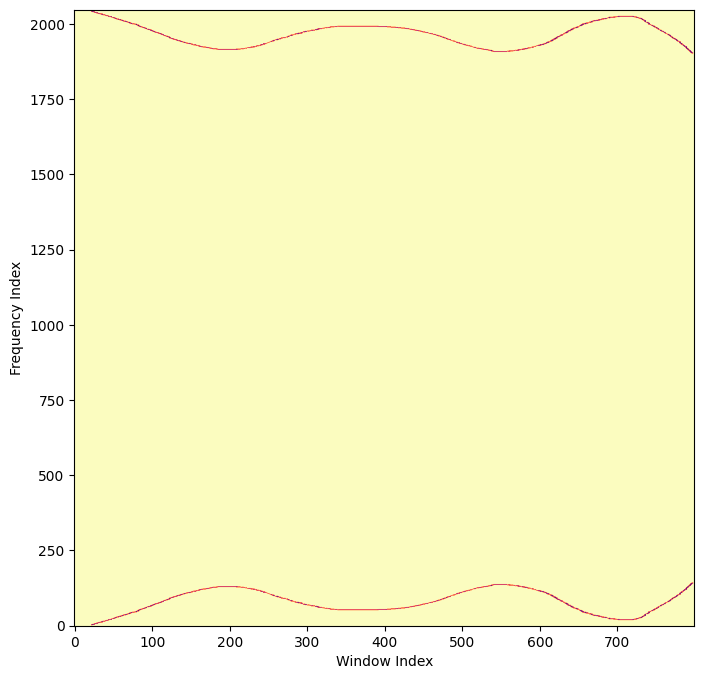

In [10]:
sr = 44100
w = 2048
h = 512
y = im2sound("Trajectory.png", w, h, hann_window, 10)
ipd.Audio(y, rate=sr)

### Example 2: DOOM

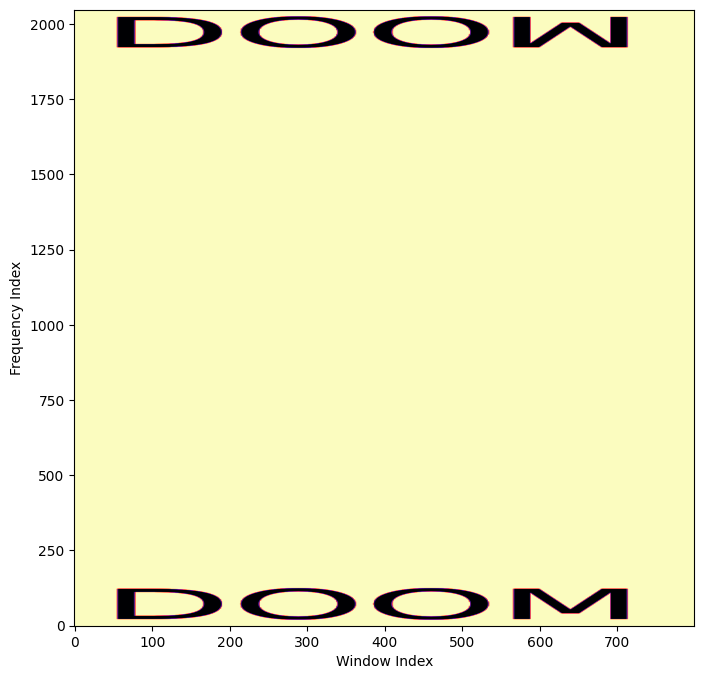

In [11]:
sr = 44100
w = 2048
h = 512
y = im2sound("Doom.png", w, h, hann_window, 10)
ipd.Audio(y, rate=sr)

### Example 3: CS 372

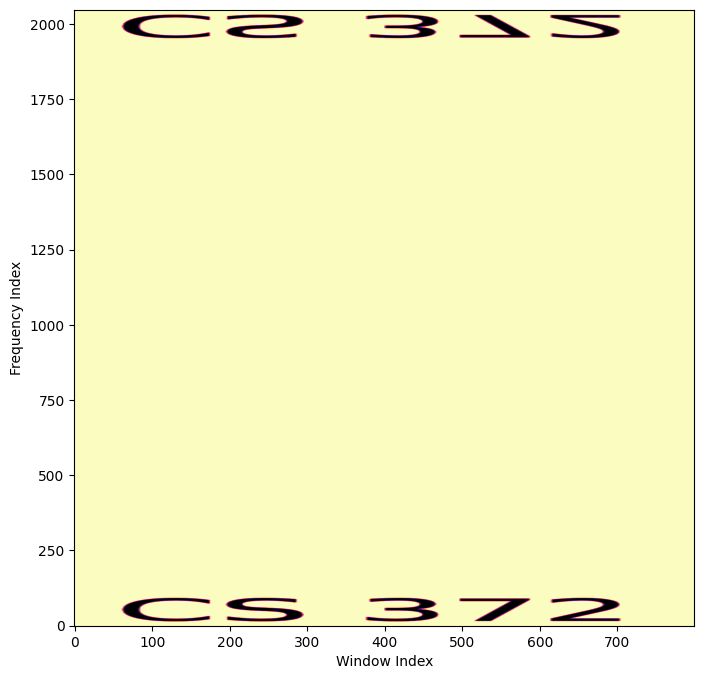

In [12]:
sr = 44100
w = 2048
h = 512
y = im2sound("CS372.png", w, h, hann_window, 10)
ipd.Audio(y, rate=sr)

## Phase Retrieval Application 2: Beepy Tunes, Aka Tricking Shazam

In [74]:
sr, x = wavfile.read("rickroll.wav")
w = 2048
h = 1024
win_fn = sin_window
time_win = 5
freq_win = 8
n_iters = 3
max_freq = 256
y = make_beepy_tune(x, w, h, win_fn, time_win, freq_win, max_freq, n_iters)
ipd.Audio(y, rate=sr)

## Phase Retrieval Application 3: Pitch Shifting 

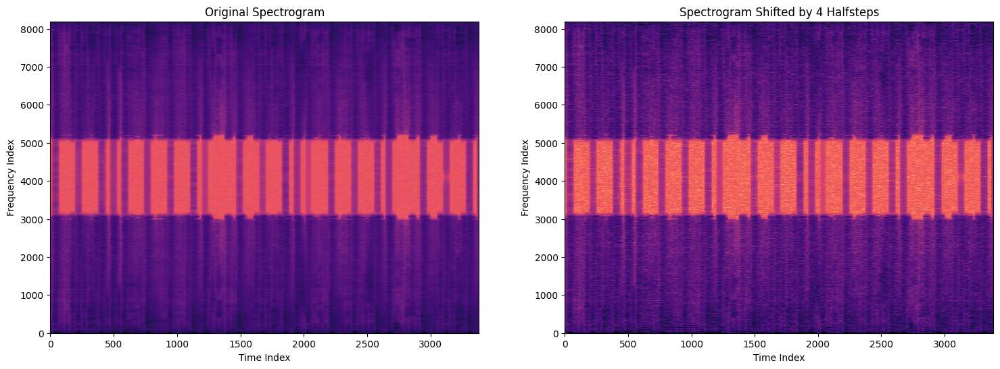

In [20]:
w =  8192
h = 128
win_fn = hann_window
sr, voice = wavfile.read("mj.wav")
y = pitch_shift(voice, 4, w, h, win_fn, 10)
ipd.Audio(y, rate=int(sr))

# Musical Statement

In [75]:
sr, x = wavfile.read("QueenBohemian.wav")
w = 2048
h = 1024
win_fn = sin_window
time_win = 5
freq_win = 8
n_iters = 3
max_freq = 256
y = make_beepy_tune(x, w, h, win_fn, time_win, freq_win, max_freq, n_iters)
ipd.Audio(y, rate=sr)